In [18]:
%pip install google-genai

In [19]:
import google.generativeai as genai

In [20]:
from google.colab import userdata
import os

os.environ['GOOGLE_API_KEY'] = userdata.get('GOOGLE_API_KEY')

In [21]:
!apt-get update -qq && apt-get install -qq locales
!locale-gen en_US.UTF-8
!update-locale LANG=en_US.UTF-8 LC_ALL=en_US.UTF-8

!apt-get -qq -y install espeak-ng > /dev/null 2>&1
%pip install -q google-generativeai moviepy Pillow
%pip install -q nest_asyncio

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Generating locales (this might take a while)...
  en_US.UTF-8... done
Generation complete.


In [23]:
#Core Data Processing
import os
import json
import numpy as np
from io import BytesIO

#Image Handling
from PIL import Image
from IPython.display import display


#For Video & Audio
from moviepy.editor import ImageClip, AudioFileClip, CompositeVideoClip, concatenate_videoclips

import time
from IPython.display import HTML
from base64 import b64encode

import typing_extensions as typing


#async support
import nest_asyncio
nest_asyncio.apply()
import asyncio
import contextlib
import wave


#Google GenAI
from google import genai

In [24]:
from google import genai
client = genai.Client(http_options = {
    'api_version':'v1alpha'
})

MODEL = "models/gemini-2.0-flash-exp"

IMAGE_MODEL_ID = "imagen-3.0-generate-002"

In [25]:
class StorySegment(typing.TypedDict):
  image_prompt: str
  audio_text: str
  character_description:str


class StoryResponse(typing.TypedDict):
  complete_story: list[StorySegment]
  pages:int

def generate_story_sequence(complete_story:str, pages:int) -> list[StoryResponse]:
  response = client.models.generate_content(
      model=MODEL,
      contents=f'''you are an animation video producer. Generate a story sequence about {complete_story} in {pages} scenes (with interactions and characters), 1 sec each scene. Write:

image_prompt:(define art style for kids animation(consistent for all the characters), no violence) a full description of the scene, the characters in it, and the background in 20 words or less. Progressively shift the scene as the story advances.
audio_text: a one-sentence dialogue/narration for the scene.
character_description: no people ever, only animals and objects. Describe all characters (consistent names, features, clothing, etc.) with an art style reference (e.g., "Pixar style," "photorealistic," "Ghibli") in 30 words or less.
''',
      config={
          'response_mime_type':'application/json',
          'response_schema': list[StoryResponse]
      }
  )
  try:
    story_data_text = response.text
    story_data_list = json.loads(story_data_text)
    if isinstance(story_data_list,list) and len(story_data_list)>0:
      story_data = story_data_list[0]
      return story_data.get('complete_story',[]),story_data.get('character_description',{})
    else:
      return[]
  except (KeyError, TypeError, IndexError, json.JSONDecodeError) as e:
    print(f"Error parsing story data: {e}")
    return[]





In [26]:
theme = "Tom and Jerry become friends"
num_scenes = 5

story_segments, _ = generate_story_sequence(theme, num_scenes)
print(json.dumps(story_segments,indent=2))


[
  {
    "image_prompt": "Tom, a blue cat, chases Jerry, a brown mouse, through a sunny kitchen. Jars and pans fall. Style: kids animation.",
    "audio_text": "Uh oh, looks like the chase is on again!",
    "character_description": "Tom, Pixar style: A blue cat with a mischievous grin, always chasing. Jerry, Pixar style: A small, quick brown mouse with big eyes, always evading."
  },
  {
    "image_prompt": "Jerry trips, dropping cheese. Tom stops, surprised, near the cheese. Background: same sunny kitchen. Style: kids animation.",
    "audio_text": "Wait, what's this? A change of pace?",
    "character_description": "Tom, Pixar style: A blue cat with a mischievous grin, now surprised. Jerry, Pixar style: A small, quick brown mouse, momentarily stunned, cheese scattered around."
  },
  {
    "image_prompt": "Tom and Jerry cautiously share the cheese, sitting a small distance apart. Background: bright, colorful kitchen. Style: kids animation.",
    "audio_text": "Sharing is caring, ev

In [28]:
@contextlib.contextmanager
def wave_file(filename, channels=1, rate=24000, sample_width=2):
    with wave.open(filename, "wb") as wf:
        wf.setnchannels(channels)
        wf.setsampwidth(sample_width)
        wf.setframerate(rate)
        yield wf

In [29]:
# --- Cell 2: Definitions and setup ---
temp_audio_files = []  # To track temporary audio files
temp_image_files = []  # To track temporary image files
video_clips = []       # To store individual video clips for each scene

def generate_audio_live(api_text, output_filename):
    import asyncio
    collected_audio = bytearray()

    async def _generate():
        config = {
            "response_modalities": ["AUDIO"]
        }
        # Connect to the Live API using the client already initialized above.
        async with client.aio.live.connect(model=MODEL, config=config) as session:
            # Send the audio_text prompt; mark as end_of_turn.
            await session.send(input=api_text, end_of_turn=True)
            # Collect audio data as it streams in.
            async for response in session.receive():
                if response.data:
                    collected_audio.extend(response.data)
        return bytes(collected_audio)

    # Run the async function and collect the audio bytes.
    audio_bytes = asyncio.run(_generate())
    # Write the collected audio bytes into a WAV file using the helper.
    with wave_file(output_filename) as wf:
        wf.writeframes(audio_bytes)
    return output_filename



# Note: Use a system instruction to prevent common AI responses and ensure natural narration
audio_negative_prompt = "don't say OK , I will do this or that, just only read this story using voice expressions without introductions or ending ,more segments are coming ,don't say OK , I will do this or that:\n"

Processing scene 0:
Image Prompt: Tom, a blue cat, chases Jerry, a brown mouse, through a sunny kitchen. Jars and pans fall. Style: kids animation.
Audio Text: Uh oh, looks like the chase is on again!
Character Description: Tom, Pixar style: A blue cat with a mischievous grin, always chasing. Jerry, Pixar style: A small, quick brown mouse with big eyes, always evading.
--------------------------------


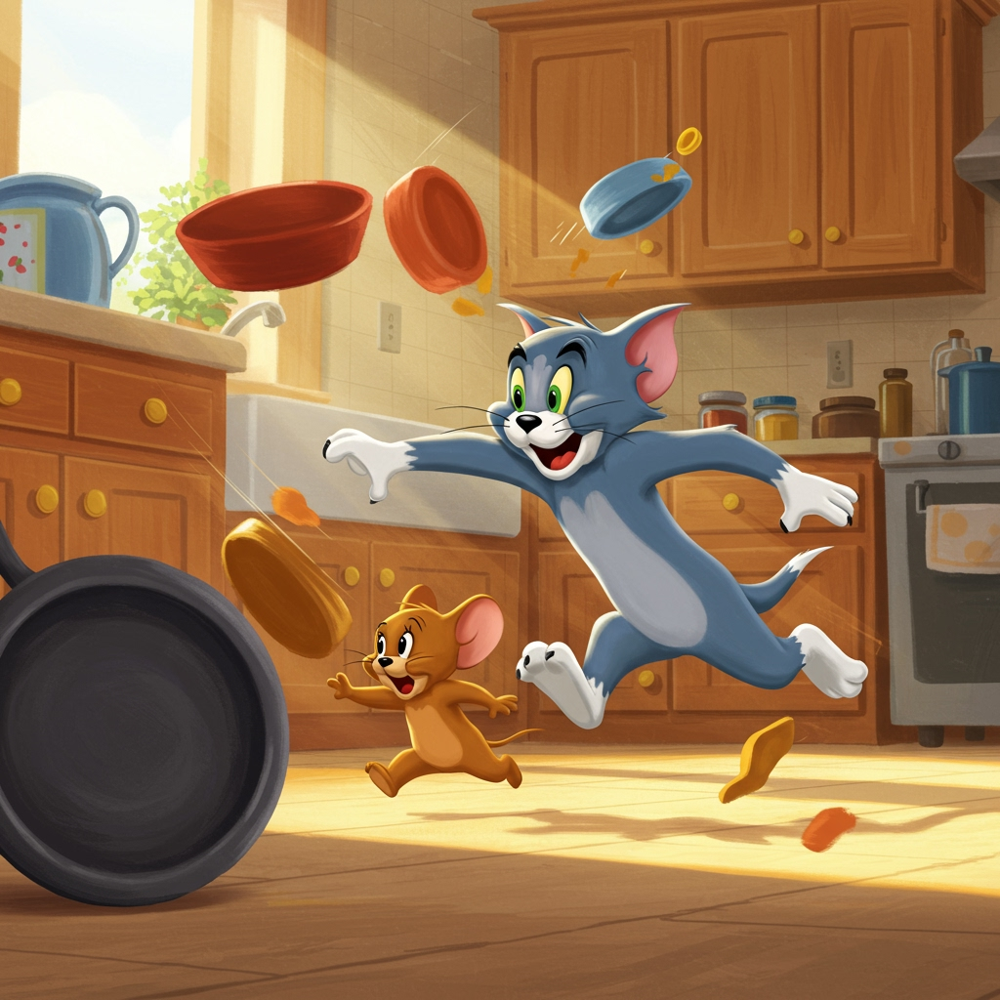

Please use one of the more specific methods: `send_client_content`, `send_realtime_input`, or `send_tool_response` instead.
  await session.send(input=api_text, end_of_turn=True)



Processing scene 1:
Image Prompt: Jerry trips, dropping cheese. Tom stops, surprised, near the cheese. Background: same sunny kitchen. Style: kids animation.
Audio Text: Wait, what's this? A change of pace?
Character Description: Tom, Pixar style: A blue cat with a mischievous grin, now surprised. Jerry, Pixar style: A small, quick brown mouse, momentarily stunned, cheese scattered around.
--------------------------------


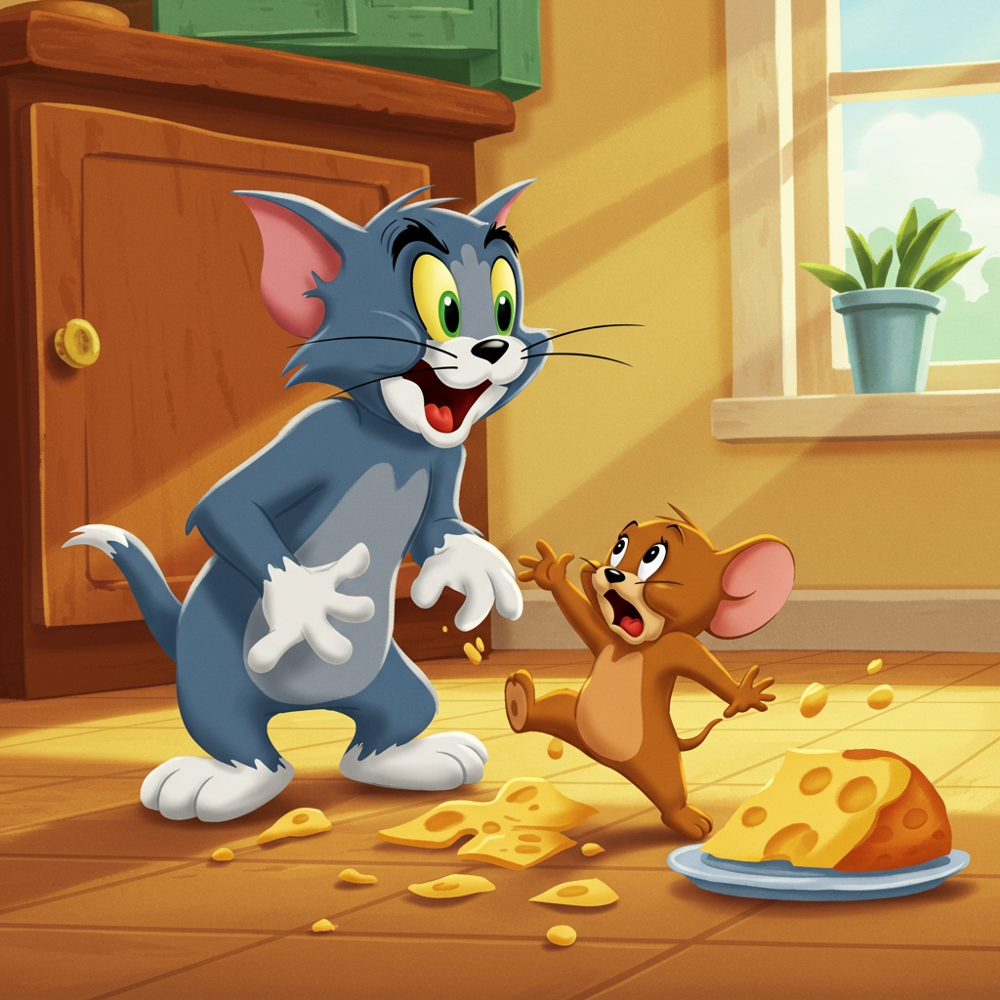

Processing scene 2:
Image Prompt: Tom and Jerry cautiously share the cheese, sitting a small distance apart. Background: bright, colorful kitchen. Style: kids animation.
Audio Text: Sharing is caring, even for rivals!
Character Description: Tom, Pixar style: A blue cat, hesitant but curious. Jerry, Pixar style: A small, brown mouse, also cautious, both enjoying the cheese.
--------------------------------


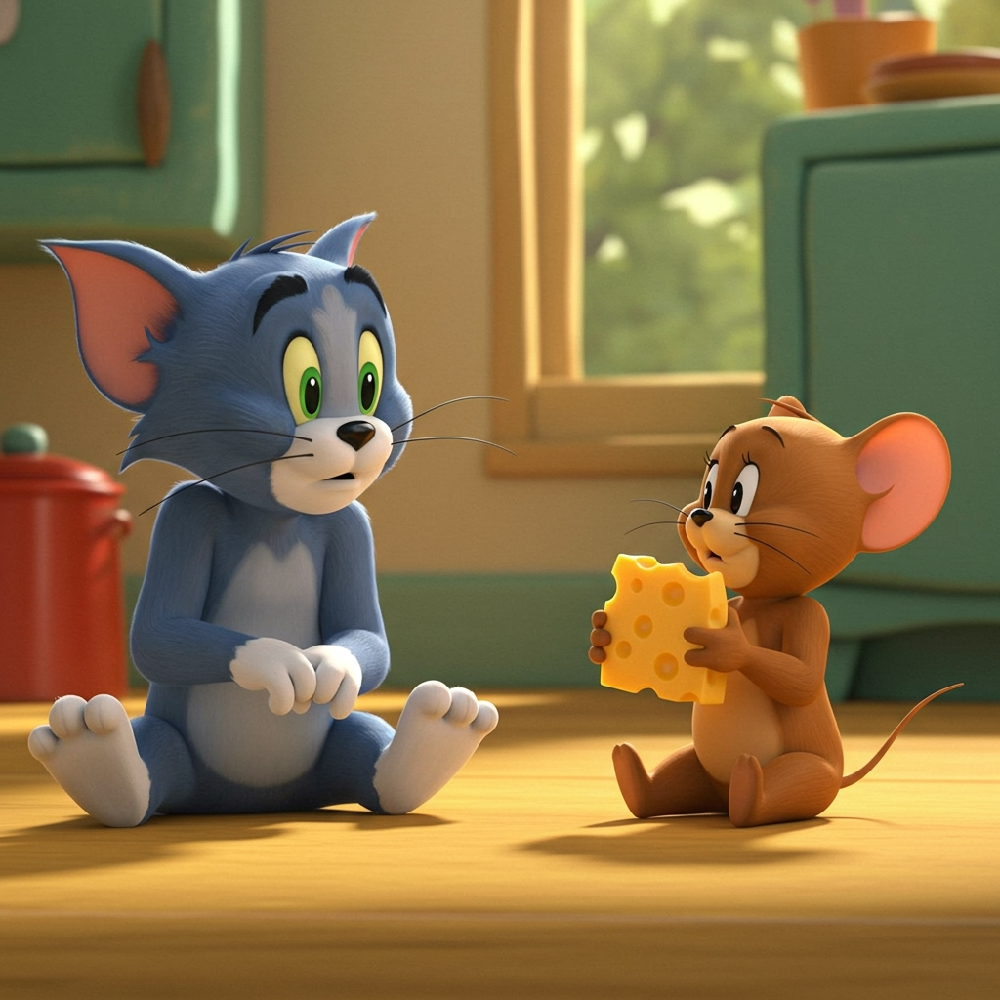

Processing scene 3:
Image Prompt: Tom and Jerry, closer now, laugh together while eating cheese. Soft lighting. Background: Warm, inviting kitchen. Style: kids animation.
Audio Text: Could this be the start of a beautiful friendship?
Character Description: Tom, Pixar style: A blue cat, laughing genuinely. Jerry, Pixar style: A small, brown mouse, giggling, both covered in cheese crumbs.
--------------------------------


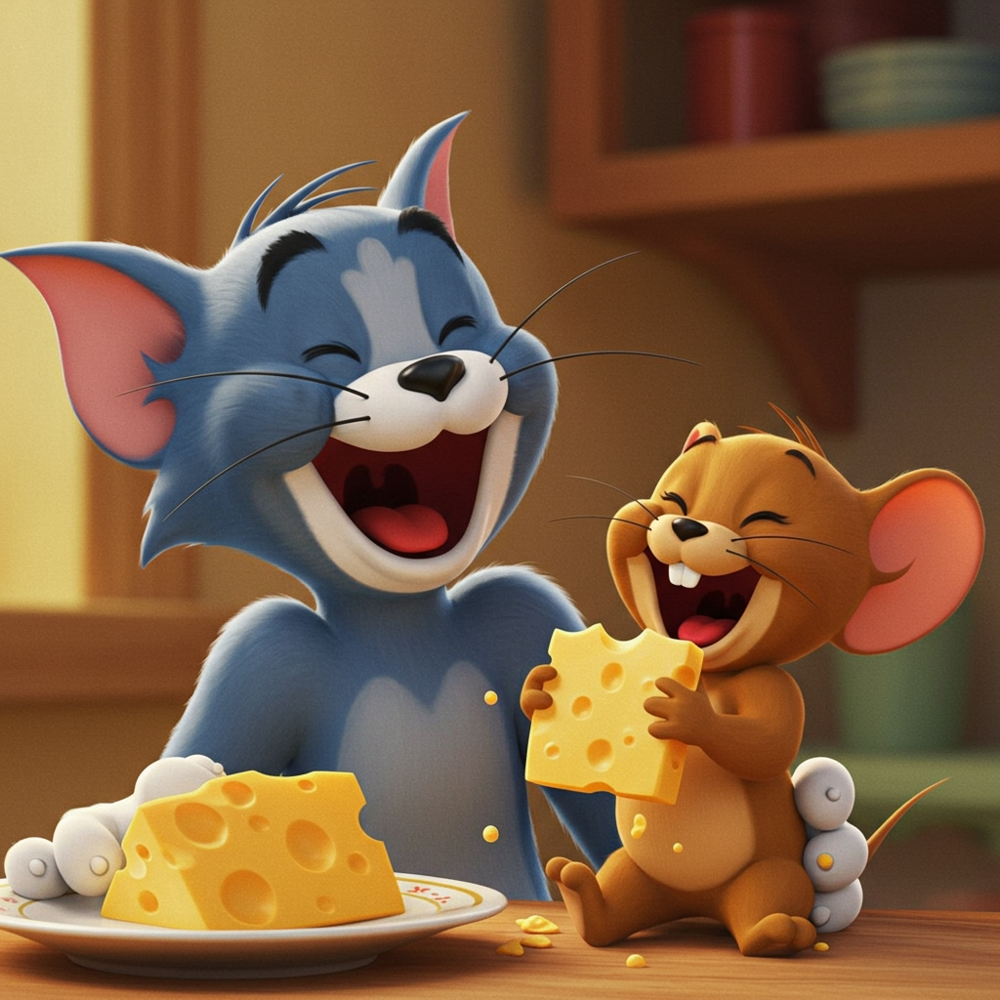

Processing scene 4:
Image Prompt: Tom and Jerry are now best friends, arm in arm, smiling. They stand in a peaceful meadow. Style: kids animation.
Audio Text: Tom and Jerry are friends for life!
Character Description: Tom, Pixar style: A happy blue cat, arm around Jerry. Jerry, Pixar style: A cheerful brown mouse, arm around Tom, both beaming with joy.
--------------------------------


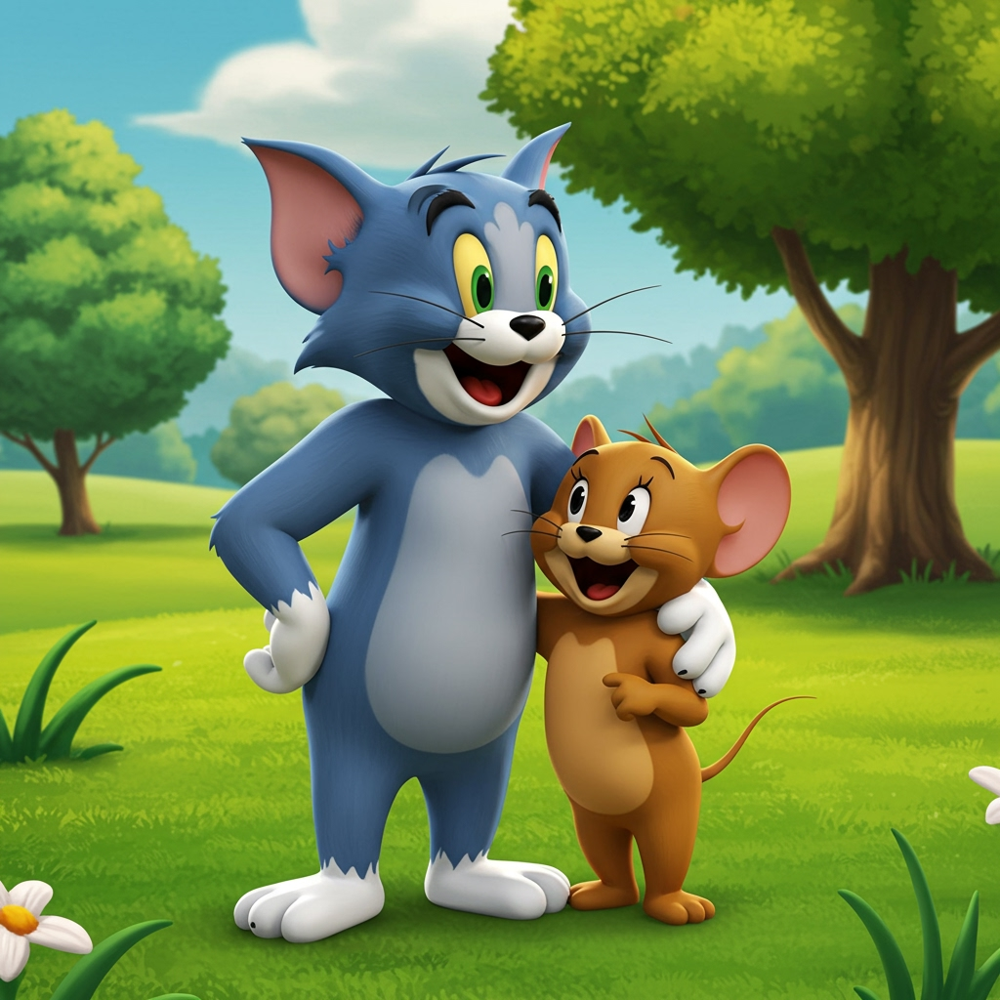

In [30]:
# --- Cell 3: Main processing loop ---
for i, segment in enumerate(story_segments):
    # Retrieve details for the current scene.
    image_prompt = segment['image_prompt']
    audio_text =  audio_negative_prompt + segment['audio_text']
    audio_text_prompt = segment['audio_text']
    char_desc = segment['character_description']
    print(f"Processing scene {i}:")
    print("Image Prompt:", image_prompt)
    print("Audio Text:", audio_text_prompt)
    print("Character Description:", char_desc)
    print("--------------------------------")

    # -------------------------
    # Image Generation using Google Imagen
    # -------------------------
    combined_prompt = "detailed children book animation style " + image_prompt + " " + char_desc

    result = client.models.generate_images(
        model=IMAGE_MODEL_ID,
        prompt=combined_prompt,
        config={
            "number_of_images": 1,
            "output_mime_type": "image/jpeg",
            "person_generation": "DONT_ALLOW",
            "aspect_ratio": "1:1"
        }
    )

    try:
        if not result.generated_images:
            raise ValueError("No images were generated. The prompt might have been flagged as harmful. Please modify your prompt and try again.")
        for generated_image in result.generated_images:
            image = Image.open(BytesIO(generated_image.image.image_bytes))
    except Exception as e:
        print("Image generation failed ", e)

    image_path = f"image_{i}.png"
    image.save(image_path)
    temp_image_files.append(image_path)
    display(image)

    # -------------------------
    # Audio Generation using Google Live API
    # -------------------------
    audio_path = f"audio_{i}.wav"
    audio_path = generate_audio_live(audio_text, audio_path)
    temp_audio_files.append(audio_path)


    # -------------------------
    # Create Video Clip (Image + Audio)
    # -------------------------
    audio_clip = AudioFileClip(audio_path)

    # Convert PIL Image to numpy array
    np_image = np.array(image)

    # Create ImageClip (size is inferred from np_image)
    image_clip = ImageClip(np_image).set_duration(audio_clip.duration)

    # Store composite clip with audio in memory
    composite_clip = CompositeVideoClip([image_clip]).set_audio(audio_clip)
    video_clips.append(composite_clip)

In [31]:
final_video = concatenate_videoclips(video_clips)
output_filename = f"{int(time.time())}_output_video.mp4"
print("Writing final video to", output_filename)
final_video.write_videofile(output_filename, fps=24)

# Display the video in the notebook
def show_video(video_path):
    """Display video in notebook"""
    video_file = open(video_path, "rb")
    video_bytes = video_file.read()
    video_b64 = b64encode(video_bytes).decode()
    video_tag = f'<video width="640" height="480" controls><source src="data:video/mp4;base64,{video_b64}" type="video/mp4"></video>'
    return HTML(video_tag)

# Show the video
display(show_video(output_filename))

# Cleanup: Close video clips and remove temporary files
final_video.close()
for clip in video_clips:
    clip.close()
for file in temp_audio_files:
    os.remove(file)
for file in temp_image_files:
    os.remove(file)


# A video player will appear below

Writing final video to 1747235900_output_video.mp4
Moviepy - Building video 1747235900_output_video.mp4.
MoviePy - Writing audio in 1747235900_output_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video 1747235900_output_video.mp4



Moviepy - Done !
Moviepy - video ready 1747235900_output_video.mp4
